## Модуль 15 Обработка временных рядов

In [1]:
import pandas as pd
import numpy as np

from statsmodels.tsa.seasonal import seasonal_decompose
from matplotlib import pyplot as plt

In [2]:
# Загрузим датасет, который описывает продажи разных магазинов (store_nbr). 
# Для каждого магазина указан продукт и его количество ('unit_sales'). 

In [3]:
df = pd.read_csv('train.csv', parse_dates=[1])

C:\Users\Lyo\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3186: DtypeWarning: Columns (5) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [4]:
df.head()

,id,date,store_nbr,item_nbr,unit_sales,onpromotion
0,0,2013-01-01,25,103665,7.0,NaN
1,1,2013-01-01,25,105574,1.0,NaN
2,2,2013-01-01,25,105575,2.0,NaN
3,3,2013-01-01,25,108079,1.0,NaN
4,4,2013-01-01,25,108701,1.0,NaN


In [5]:
# Нас интересует магазин с номером 25. 
# Сгруппируем данные по дате и просуммируем количество всех продаж.

In [6]:
df_shop25 = df[df.store_nbr == 25].groupby(df.date)['unit_sales'].agg('sum').reset_index()
df_shop25.columns  = ['date', 'sales']
df_shop25.head()

,date,sales
0,2013-01-01,2511.619
1,2013-01-02,5316.224
2,2013-01-03,4442.913
3,2013-01-04,4844.354
4,2013-01-05,5817.526


In [7]:
# Сделаем сезонную декомпозицию.

In [8]:
# Сгруппируем помесячно
df_shop25 = df_shop25.set_index(df_shop25.date)
df_shop25.drop(['date'], axis=1, inplace=True)

df_shop25_m = df_shop25.resample('M').sum()

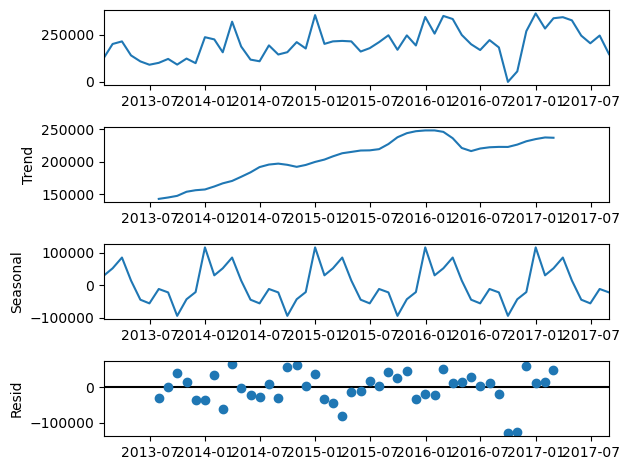

In [9]:
# Декомпозиция
decomposition = seasonal_decompose(df_shop25_m, model='additive')
decomposition.plot()
plt.show()                                  

In [10]:
trend_part = decomposition.trend # трендовая составляющаяя
seasonal_part = decomposition.seasonal # сезонная составляющаяя
residual_part = decomposition.resid # шум

In [11]:
print(f'Исходный датасет содержит {df_shop25_m.count()[0]} элемента(ов)')

Исходный датасет содержит 56 элемента(ов)


In [12]:
print(f'Шумовая часть содержит {len(residual_part)} элемента(ов)')

Шумовая часть содержит 56 элемента(ов)


In [13]:
print(f'Шумовая часть содержит {residual_part.count()} числовых элемента(ов)')

Шумовая часть содержит 44 числовых элемента(ов)


In [14]:
print(f'Сезонная часть содержит {seasonal_part.count()} элемента(ов)')

Сезонная часть содержит 56 элемента(ов)


In [15]:
print(f'Трендовая часть содержит {trend_part.count()} элемента(ов)')

Трендовая часть содержит 44 элемента(ов)


In [16]:
# Выполним тест Дики-Фуллера.

In [17]:
from statsmodels.tsa.stattools import adfuller

test = adfuller(df_shop25_m['sales'])
print ('adf: ', test[0] )
print ('p-value: ', test[1])
print ('Critical values: ', test[4])
if test[0]> test[4]['5%']: # проверка, больше ли критического полученное значение для нашего ряда 
    print ('ряд нестационарен')
else:
    print ('ряд стационарен')

adf:  -1.6319367447143018
p-value:  0.4664771069810931
Critical values:  {'1%': -3.5885733964124715, '5%': -2.929885661157025, '10%': -2.6031845661157025}
ряд нестационарен


### 15.6 Особенности валидации временных рядов

In [18]:
# Разобьем временной ряд на три набора

In [19]:
from sklearn.model_selection import TimeSeriesSplit

In [20]:
tscv = TimeSeriesSplit(n_splits=3, test_size=7)

In [21]:
# Проверим размеры полученных подвыборок.

In [22]:
for i, (train_index, test_index) in enumerate(tscv.split(df_shop25_m)):
    print(f'Fold {i}, Train size: {len(train_index)}, Test size: {len(test_index)}')

Fold 0, Train size: 35, Test size: 7
Fold 1, Train size: 42, Test size: 7
Fold 2, Train size: 49, Test size: 7


### 15.8 Расчёт факторов при помощи pandas.

In [23]:
# Оконные функции

In [24]:
# Напишем функции, возвращающие скользящее среднее и скользящее квадратическое отклонение
# с заданным параметром размера окна

In [25]:
def rolling_mean(series, window):
    """ Функция построения скользящего среднего """
    return series.rolling(window=window).mean()


def rolling_std(series, window):
    """ Функция построения скользящего квадратического отклонения """
    return series.rolling(window=window).std()

In [26]:
# Построим скользящее среднее c окном 5.

In [27]:
df_shop25_m['mean_5'] = rolling_mean(df_shop25_m.sales, 5)
df_shop25_m['mean_5'].head(7)

date
2013-01-31            NaN
2013-02-28            NaN
2013-03-31            NaN
2013-04-30            NaN
2013-05-31    159273.9038
2013-06-30    151475.1624
2013-07-31    131426.2188
Freq: M, Name: mean_5, dtype: float64

In [28]:
# Построим скользящее квадратическое отклонение c окном 5.

In [29]:
df_shop25_m['std_5'] = rolling_std(df_shop25_m.sales, 5)
df_shop25_m['std_5'].head(7)

date
2013-01-31             NaN
2013-02-28             NaN
2013-03-31             NaN
2013-04-30             NaN
2013-05-31    46461.370913
2013-06-30    55043.304673
2013-07-31    50343.344726
Freq: M, Name: std_5, dtype: float64

In [30]:
# Построим линии Боллинджера на месячном графике с окном 30, по формуле:
# верхняя граница: rolling_mean + rolling_std * 3
# нижняя граница: rolling_mean - rolling_std * 3

In [31]:
# Размер окна
N = 30

In [32]:
df_shop25_m[f'mean_{N}'] = rolling_mean(df_shop25_m.sales, N)
df_shop25_m[f'std_{N}'] = rolling_std(df_shop25_m.sales, N)

In [33]:
# Линии Боллинджера
df_shop25_m['bol_line_up'] = df_shop25_m.apply(lambda x: x[f'mean_{N}'] + x[f'std_{N}'] * 3, axis=1)
df_shop25_m['bol_line_low'] = df_shop25_m.apply(lambda x: x[f'mean_{N}'] - x[f'std_{N}'] * 3, axis=1)

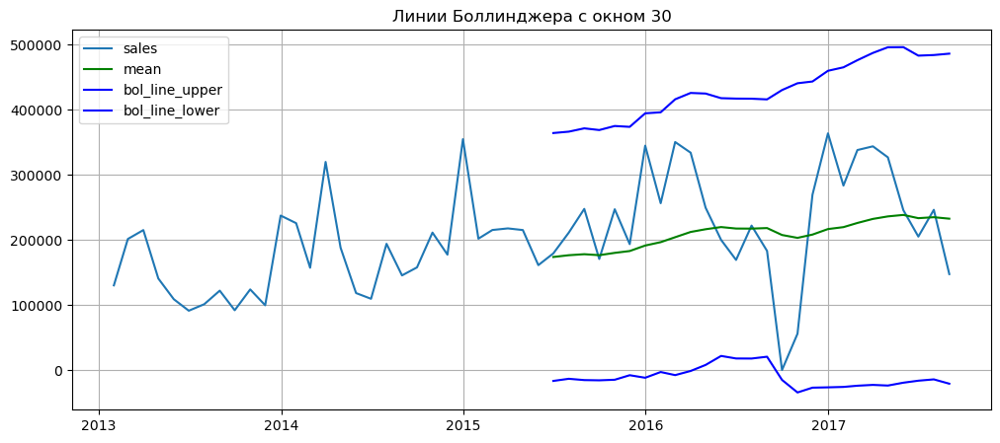

In [34]:
# Визуализация
plt.figure(figsize=(12,5))
plt.plot(df_shop25_m.sales)
plt.plot(df_shop25_m[f'mean_{N}'], c='g')
plt.plot(df_shop25_m.bol_line_up, c='b')
plt.plot(df_shop25_m.bol_line_low, c='b')
plt.title(f'Линии Боллинджера с окном {N}')
plt.legend(['sales', 'mean', 'bol_line_upper', 'bol_line_lower'])
plt.grid()

In [35]:
# Построим оконное среднее с окном в 10 точек

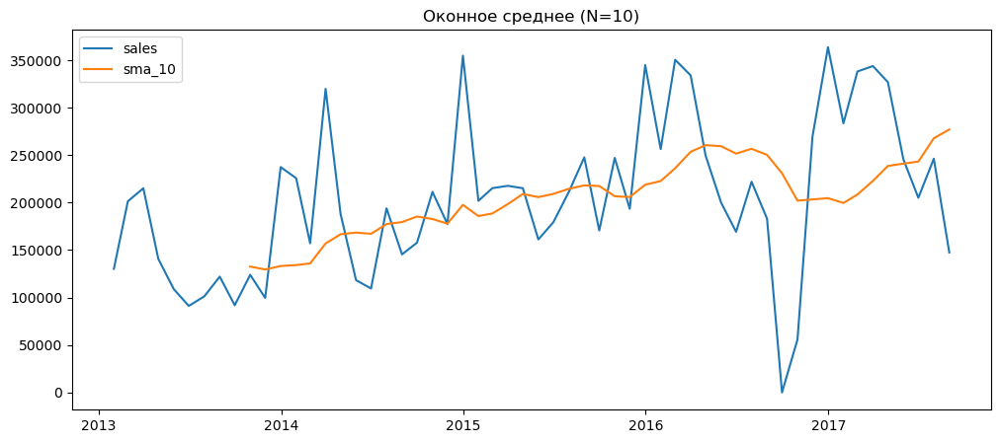

In [36]:
N = 10
df_shop25_m[f'sma_{N}'] = rolling_mean(df_shop25_m.sales, N)

plt.figure(figsize=(12, 5))
plt.plot(df_shop25_m['sales'])
plt.plot(df_shop25_m[f'sma_{N}'])
plt.title(f'Оконное среднее (N={N})')
plt.legend(['sales', f'sma_{N}'])

In [37]:
# Построим экспоненциально среднее с окном в 7 точек (span=7) и посмотрим на графике вместе с sma_10.

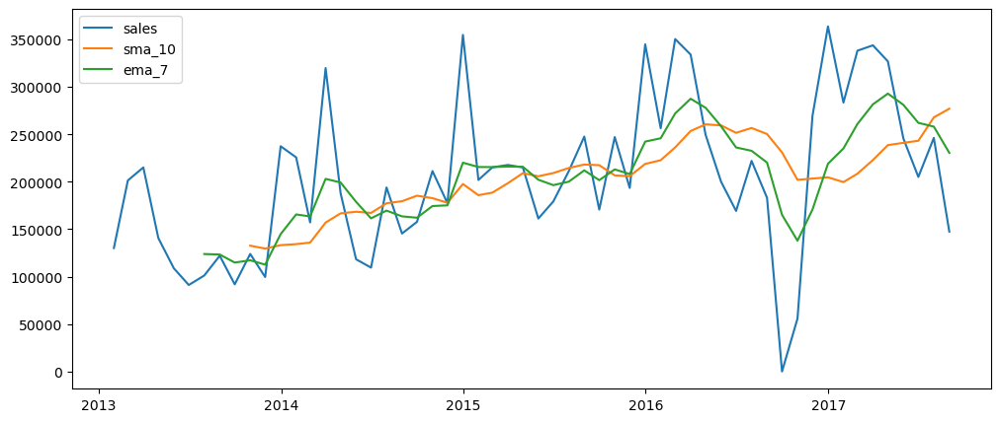

In [38]:
N = 7
df_shop25_m[f'ema_{N}'] = df_shop25_m.sales.ewm(min_periods=N, span=N).mean()

f, ax = plt.subplots(1, 1, figsize=(12, 5))
ax.plot(df_shop25_m['sales'])
ax.plot(df_shop25_m['sma_10'])
ax.plot(df_shop25_m[f'ema_{N}'])
ax.legend(['sales', 'sma_10', f'ema_{N}'])

In [39]:
# sma выглядит более сглаженным за счёт б'ольшего периода

In [40]:
# Напишем скользящую функцию, которая будет являться средним 
# арифметическим между максимальным и минимальным значением unit_sales, используя окно 10.

In [41]:
def mean_max_min(value):
    return np.mean((np.min(value), np.max(value)))

In [42]:
df_shop25_m.sales.rolling(window=10).apply(mean_max_min, raw=False)

date
2013-01-31             NaN
2013-02-28             NaN
2013-03-31             NaN
2013-04-30             NaN
2013-05-31             NaN
2013-06-30             NaN
2013-07-31             NaN
2013-08-31             NaN
2013-09-30             NaN
2013-10-31    153179.19100
2013-11-30    153179.19100
2013-12-31    164345.01650
2014-01-31    164345.01650
2014-02-28    164345.01650
2014-03-31    205554.80825
2014-04-30    205903.33875
2014-05-31    205903.33875
2014-06-30    205903.33875
2014-07-31    209745.47725
2014-08-31    209745.47725
2014-09-30    214720.28395
2014-10-31    214720.28395
2014-11-30    214720.28395
2014-12-31    232215.87960
2015-01-31    232215.87960
2015-02-28    232215.87960
2015-03-31    232215.87960
2015-04-30    250183.67440
2015-05-31    250183.67440
2015-06-30    256344.36790
2015-07-31    258079.32590
2015-08-31    258079.32590
2015-09-30    258079.32590
2015-10-31    204485.23400
2015-11-30    204485.23400
2015-12-31    253098.03950
2016-01-31    253098.03

In [43]:
# Построим скользящее среднее с окном 50 и экспоненциальное скользящее среднее с окном 10 (span=10). 
# Укажем индексы датафрейма, на которых одно скользящее пересекается с другим.

In [44]:
def get_ewm(df, period, span):
    """ Функция возвращает экспоненциальное скользящее среднее """
    return df.ewm(min_periods=period, span=span).mean()

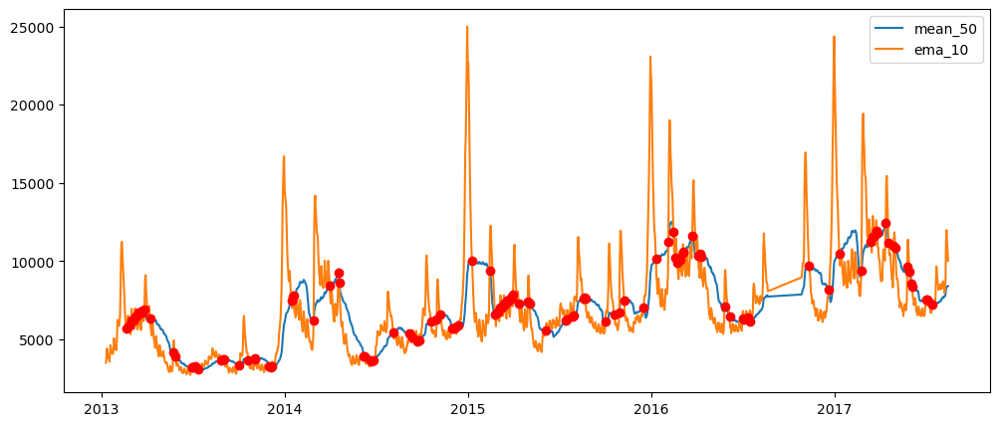

In [45]:
# На месяченом графике окно 50 - практически за пределом датасета, выполним на дневном
N = 50
EN = 10
df_shop25[f'mean_{N}'] = rolling_mean(df_shop25.sales, N)
df_shop25[f'ema_{EN}'] = get_ewm(df_shop25.sales, period=EN, span=EN)

# Пересечение
df_shop25['mean_x_ema'] = (np.sign(df_shop25[f'mean_{N}'] - df_shop25[f'ema_{EN}'])).diff().replace(0.00000, float('nan'))


plt.figure(figsize=(12, 5))
plt.plot(df_shop25[f'mean_{N}'])
plt.plot(df_shop25[f'ema_{EN}'])
plt.plot(df_shop25[df_shop25['mean_x_ema'].notna()][f'mean_{N}'],  'ro')
plt.legend([f'mean_{N}', f'ema_{EN}'])


In [46]:
# Получим лаговые факторы с 7-го по 10-й предыдущих дней (лаг7, лаг8, лаг9, лаг10)

In [47]:
for lag in range(7,11):
    df_shop25_m[f'lag_{lag}'] = df_shop25_m.sales.shift(lag)

In [48]:
df_shop25_m.head(15)

,sales,mean_5,std_5,mean_30,std_30,bol_line_up,bol_line_low,sma_10,ema_7,lag_7,lag_8,lag_9,lag_10
date,,,,,,,,,,,,,
2013-01-31,130192.0540,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-02-28,201455.1270,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-03-31,215160.0350,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-04-30,140700.7430,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-05-31,108861.5600,159273.90380,46461.370913,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-06-30,91198.3470,151475.16240,55043.304673,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-31,101210.4090,131426.21880,50343.344726,NaN,NaN,NaN,NaN,NaN,123845.803449,NaN,NaN,NaN,NaN
2013-08-31,122042.6060,112802.73300,19237.583852,NaN,NaN,NaN,NaN,NaN,123344.852419,130192.054,NaN,NaN,NaN
2013-09-30,91895.4080,103041.66600,12872.098329,NaN,NaN,NaN,NaN,NaN,114844.224320,201455.127,130192.054,NaN,NaN


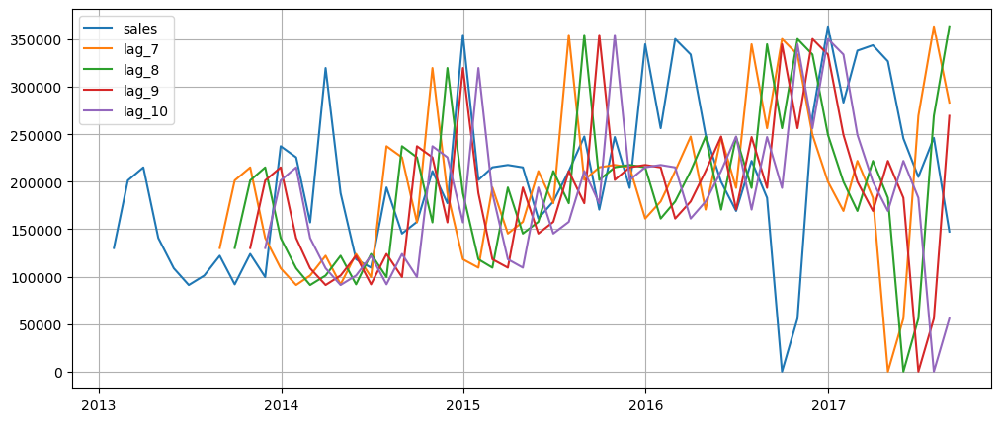

In [49]:
f, ax = plt.subplots(1, 1, figsize=(12, 5))
legend = []
ax.plot(df_shop25_m['sales'])
legend.append('sales')

for lag in range(7, 11):
    ax.plot(df_shop25_m[f'lag_{lag}'])
    legend.append(f'lag_{lag}')

ax.legend(legend)
ax.grid()    

### 15.10. ARIMA/SARIMA.

In [50]:
# Выберем продукт с номером 103501 (item_nbr) и приведём данные к 
# виду временного ряда с группировкой по дате и агрегацией

In [51]:
dftop = df[df.item_nbr == 103501]

In [52]:
# dftop.date = pd.to_datetime(dftop.date)

In [53]:
df_unit_sales = dftop.groupby('date').sum()['unit_sales']

In [54]:
# Проведём тест Адфуллера

In [55]:
from statsmodels.tsa.stattools import adfuller

In [56]:
X = df_unit_sales.values
result = adfuller(X)

print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
print('Critical Values:')
for key, value in result[4].items():
    print(f'\t{key}: {value}')

if result[0] < result[4]["5%"]:
    print("Reject Ho - Time Series is Stationary")
else:
    print("Failed to Reject Ho - Time Series is Non-Stationary")

ADF Statistic: -4.15440305801462
p-value: 0.0007863083913836295
Critical Values:
	1%: -3.4344462031760283
	5%: -2.8633492329988335
	10%: -2.5677331999518147
Reject Ho - Time Series is Stationary


Согласно тесту Адфуллера, данный ряд - стационарен

In [57]:
# Подготовим функцию для анализа метрик

In [58]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error

In [59]:
def get_errors(y_true, y_pred):
    mse = round(mean_squared_error(y_true, y_pred), 4)
    mae = round(mean_absolute_error(y_true, y_pred), 4)
    mape = round(mean_absolute_percentage_error(y_true, y_pred), 4)
    print(f'mean_squared_error: {mse}')
    print(f'mean_absolute_error: {mae}')
    print(f'mean_absolute_percentage_error: {mape}')

In [60]:
# Построим прогноз методом скользящего среднего с окном 6. Оценим метрики MSE, MAE, MAPE.

In [61]:
def moving_average_forecast(series, window_size):
    """ Прогноз на основе среднего """
    forecast = []
    for time in range(len(series) - window_size):
        forecast.append((series[time:time + window_size].mean()))
    
    return np.array(forecast)

In [62]:
moving_average_days = 6
shown_train_size = moving_average_days * 3

# moving_avg = np.array(rolling_mean(df_unit_sales, moving_average_days).dropna())
moving_avg = moving_average_forecast(df_unit_sales, moving_average_days)
moving_avg = pd.Series(moving_avg, index = df_unit_sales[moving_average_days:].index)

moving_avg

date
2013-01-08    154.000000
2013-01-09    140.333333
2013-01-10    126.666667
2013-01-11    114.666667
2013-01-12    103.166667
                 ...    
2017-08-11     93.500000
2017-08-12     87.333333
2017-08-13     82.166667
2017-08-14     84.000000
2017-08-15     83.333333
Length: 1619, dtype: float64

In [63]:
print(moving_avg[-moving_average_days:].shape, df_unit_sales[-moving_average_days:].shape)

(6,) (6,)


In [64]:
# Зафиксируем метрики
get_errors(df_unit_sales.values[-moving_average_days:], moving_avg[-moving_average_days:])

mean_squared_error: 287.088
mean_absolute_error: 13.4167
mean_absolute_percentage_error: 0.1721


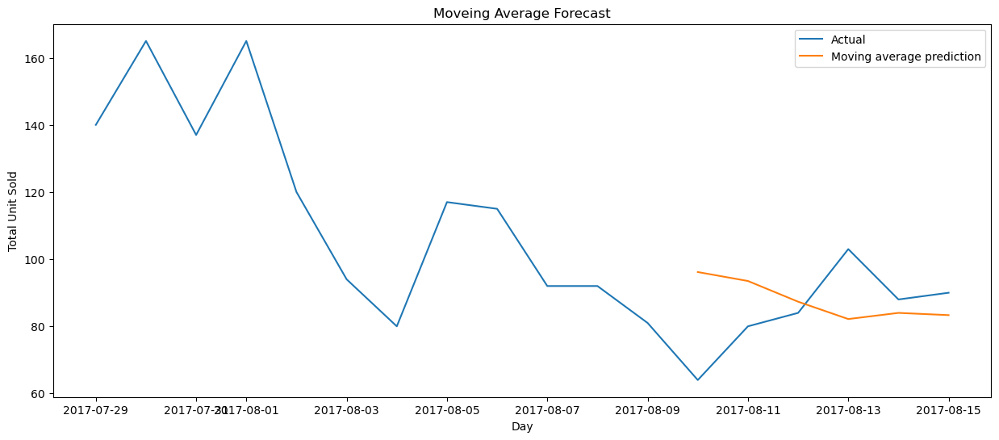

In [65]:
# Визуализация
plt.figure(figsize=(15,6))

plt.plot(df_unit_sales[-shown_train_size:], label="Actual")
plt.plot(moving_avg[-moving_average_days:], label="Moving average prediction")
plt.ylabel("Total Unit Sold")
plt.xlabel("Day")
plt.title("Moveing Average Forecast")
plt.legend(loc="upper right")

In [66]:
# Сделаем лаги с 1 по 6. 

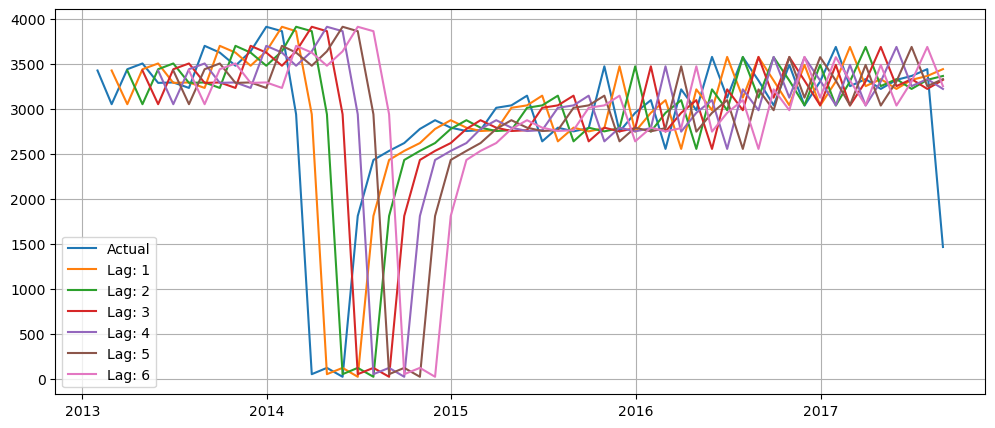

In [67]:
# Чтобы график был читаем, группирем помесячно
f, ax = plt.subplots(1, 1, figsize=(12, 5))
legend = []
# Актуальный
# ax.plot(df_unit_sales.groupby(pd.Grouper(freq='M')).agg('sum'))
ax.plot(df_unit_sales.resample('M').agg('sum'))
legend.append('Actual')

# Лаги
for lag in range(1,7):
    ax.plot(df_unit_sales.resample('M').agg('sum').shift(lag))
    legend.append(f'Lag: {lag}')

ax.legend(legend)
ax.grid()

In [68]:
# Выполним прогноз при помощи линейной регрессии

In [69]:
predict_size = 6

In [70]:
df_sales = pd.DataFrame()
df_sales['Original'] = df_unit_sales

In [71]:
# Так как такая модель позволяет использовать дополнительные признаки, 
# а предсказание будет на 6 дней - мы можем добавить лаги, начиная от 6. Возьмем несколько

In [72]:
for lag in range(0, 5):
    df_sales[f'lag_{predict_size + lag}'] = df_sales.Original.shift(predict_size + lag)

In [73]:
df_sales[10:].head()

,Original,lag_6,lag_7,lag_8,lag_9,lag_10
date,,,,,,
2013-01-12,118.0,173.0,160.0,155.0,153.0,185.0
2013-01-13,128.0,98.0,173.0,160.0,155.0,153.0
2013-01-14,97.0,103.0,98.0,173.0,160.0,155.0
2013-01-15,127.0,71.0,103.0,98.0,173.0,160.0
2013-01-16,102.0,83.0,71.0,103.0,98.0,173.0


In [74]:
df_sales.dropna(inplace=True)

In [75]:
# Разобьём датасет на тренировочную и валидационную выборки
X_train, y_train = df_sales[:-predict_size].drop(['Original'], axis=1), df_sales[:-predict_size]['Original']
X_test, y_test = df_sales[-predict_size:].drop(['Original'], axis=1), df_sales[-predict_size:]['Original']

In [76]:
y_test

date
2017-08-10     64.0
2017-08-11     80.0
2017-08-12     84.0
2017-08-13    103.0
2017-08-14     88.0
2017-08-15     90.0
Name: Original, dtype: float64

In [77]:
from sklearn.linear_model import LinearRegression
reg = LinearRegression().fit(X_train, y_train)
print(reg.coef_)
print(reg.intercept_)

[ 0.07863977  0.48621518  0.08125855 -0.08440603 -0.05156782]
49.58755401730207


In [78]:
ar_predictions = pd.Series(reg.predict(X_test), index=X_test.index)

mean_squared_error: 242.1943
mean_absolute_error: 12.6488
mean_absolute_percentage_error: 0.1637


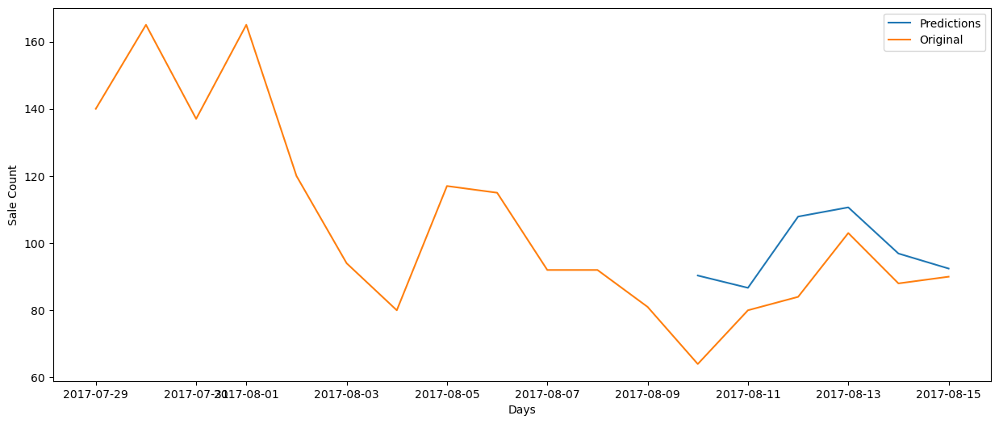

In [79]:
plt.figure(figsize=(15,6))
plt.plot(ar_predictions, label='Predictions')
plt.plot(pd.concat([y_train, y_test], axis=0)[-shown_train_size:], label='Original')
plt.xlabel('Days')
plt.ylabel('Sale Count')
plt.legend(loc="upper right")

get_errors(y_test, ar_predictions)

Результат лучше, чем MA

In [80]:
# Построим модель ARIMA

Для построения модели, нам нужны следующие величины
- p — порядок компоненты AR
- d — порядок интегрированного ряда
- q — порядок компонетны MA

Так как ряд стационарный, d=0. Определим p и q (при помощи анализа ACF и PACF)

C:\Users\Lyo\Anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,


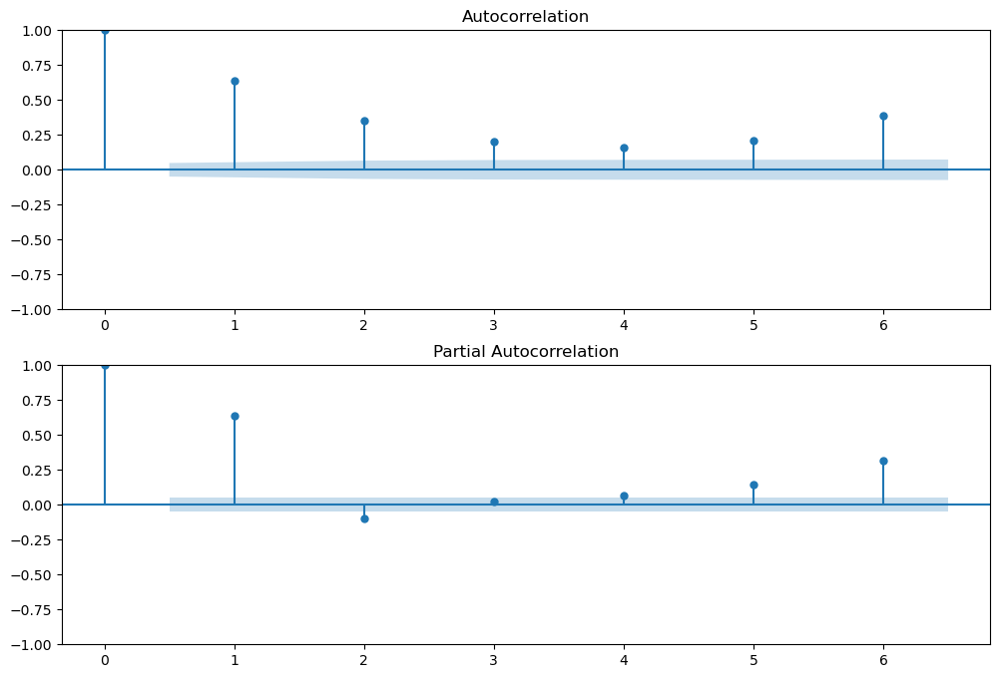

In [81]:
import statsmodels.api as sm

fig = plt.figure(figsize=(12,8))

ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_unit_sales.values.squeeze(), lags=6, ax=ax1)

ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_unit_sales, lags=6, ax=ax2)

После изучения коррелограммы PACF можно сделать вывод, что p = 6, т.к. на ней все лаги сильно отличны от нуля.
По коррелограмме ACF можно предположить, что q = 6, т.к. на лаг 6 значении функций резко возрастает.

In [82]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_predict

In [83]:
model = ARIMA(y_train.values.reshape(-1), order=(6,0,6))

In [84]:
train_size = len(y_train)
test_size = predict_size

In [85]:
arima_predictions = model.fit().predict(start=train_size, end=train_size+test_size-1, dynamic=False)

C:\Users\Lyo\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\Lyo\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\Lyo\Anaconda3\lib\site-packages\statsmodels\base\model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


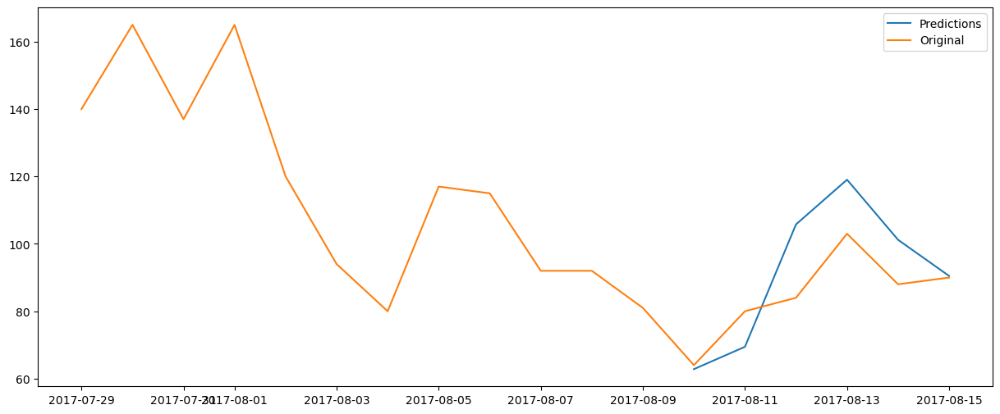

In [86]:
plt.figure(figsize=(15,6))
plt.plot(pd.Series(arima_predictions, index=y_test.index), label='Predictions')
plt.plot(pd.concat([y_train, y_test], axis=0)[-shown_train_size:], label='Original')
plt.legend(loc='upper right')

In [87]:
get_errors(y_test, arima_predictions)

mean_squared_error: 169.7349
mean_absolute_error: 10.5365
mean_absolute_percentage_error: 0.1201


#### Вывод: Модель линейной регрессии, на этом примере, показывает более схожий график и даёт результат лучше, чем MA. Но точнее всего оказалась модель ARIMA, заметно снизив ошибку прогнозирования и более точно показывая тенденцию на графике.

### 15.12 FPProphet

In [88]:
# Подготовим датасет
# Должен получиться временной ряд с двумя столбцами: дата и sum_unit_sales. 

In [89]:
df.head()

,id,date,store_nbr,item_nbr,unit_sales,onpromotion
0,0,2013-01-01,25,103665,7.0,NaN
1,1,2013-01-01,25,105574,1.0,NaN
2,2,2013-01-01,25,105575,2.0,NaN
3,3,2013-01-01,25,108079,1.0,NaN
4,4,2013-01-01,25,108701,1.0,NaN


In [90]:
df_timeseries = df.groupby(df.date).sum()['unit_sales'].reset_index()
df_timeseries = df_timeseries.set_index(df_timeseries.date)
df_timeseries.drop('date', axis=1, inplace=True)
df_timeseries.columns = ['sum_unit_sales']
df_timeseries.head()

,sum_unit_sales
date,
2013-01-01,2511.619
2013-01-02,496092.418
2013-01-03,361429.231
2013-01-04,354459.677
2013-01-05,477350.121


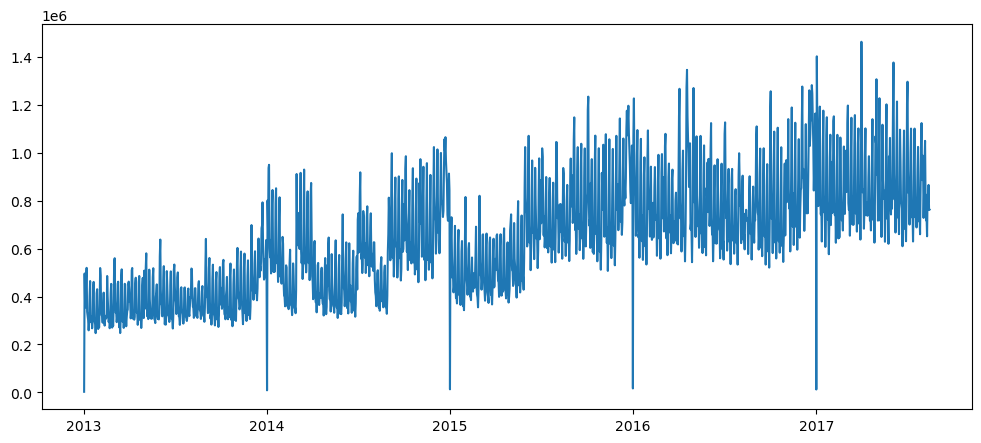

In [91]:
plt.figure(figsize=(12,5))
plt.plot(df_timeseries)

На графике видно влияние сезонности и праздников (особенно в Новый год)

In [92]:
# Выполним предсказание пророком (prophet) на год вперёд (periods=365). 
# Точность будем оценивать с помощью RSME.

In [93]:
## Установка fbprophet ##
#
# On Prompt install Ephem:
# conda install -c anaconda ephem
#
# Install Pystan:
# conda install -c conda-forge pystan
#
# Finally install Fbprophet
# conda install -c conda-forge fbprophet

In [94]:
from fbprophet import Prophet

In [95]:
# Входными данными для Prophet всегда является фрейм данных с двумя столбцами: ds и y
df_timeseries = pd.DataFrame(df_timeseries).reset_index()
df_timeseries.columns = ['ds', 'y']
df_timeseries

,ds,y
0,2013-01-01,2511.619
1,2013-01-02,496092.418
2,2013-01-03,361429.231
3,2013-01-04,354459.677
4,2013-01-05,477350.121
...,...,...
1679,2017-08-11,826373.722
1680,2017-08-12,792630.535
1681,2017-08-13,865639.677
1682,2017-08-14,760922.406


In [96]:
m = Prophet()
m.fit(df_timeseries)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)
forecast

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,334051.734900,229090.037526,5.104816e+05,334051.734900,3.340517e+05,43512.534378,43512.534378,43512.534378,-68157.290939,-68157.290939,-68157.290939,111669.825316,111669.825316,111669.825316,0.0,0.0,0.0,3.775643e+05
1,2013-01-02,334428.558715,251695.686064,5.248762e+05,334428.558715,3.344286e+05,55547.430208,55547.430208,55547.430208,-44197.657491,-44197.657491,-44197.657491,99745.087699,99745.087699,99745.087699,0.0,0.0,0.0,3.899760e+05
2,2013-01-03,334805.382530,152650.288669,4.385665e+05,334805.382530,3.348054e+05,-44076.068708,-44076.068708,-44076.068708,-131876.949938,-131876.949938,-131876.949938,87800.881230,87800.881230,87800.881230,0.0,0.0,0.0,2.907293e+05
3,2013-01-04,335182.206345,218135.245264,4.874654e+05,335182.206345,3.351822e+05,18979.815624,18979.815624,18979.815624,-57035.600836,-57035.600836,-57035.600836,76015.416460,76015.416460,76015.416460,0.0,0.0,0.0,3.541620e+05
4,2013-01-05,335559.030160,398833.825211,6.731124e+05,335559.030160,3.355590e+05,198559.922942,198559.922942,198559.922942,134003.122248,134003.122248,134003.122248,64556.800694,64556.800694,64556.800694,0.0,0.0,0.0,5.341190e+05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2044,2018-08-11,990334.073294,909211.806878,1.193427e+06,945980.501074,1.033434e+06,63004.650000,63004.650000,63004.650000,134003.122248,134003.122248,134003.122248,-70998.472247,-70998.472247,-70998.472247,0.0,0.0,0.0,1.053339e+06
2045,2018-08-12,990597.061549,952487.809753,1.236093e+06,946075.622104,1.033889e+06,116920.249888,116920.249888,116920.249888,188404.142851,188404.142851,188404.142851,-71483.892963,-71483.892963,-71483.892963,0.0,0.0,0.0,1.107517e+06
2046,2018-08-13,990860.049803,745660.652112,1.044759e+06,946130.261354,1.034297e+06,-92448.329842,-92448.329842,-92448.329842,-21139.765895,-21139.765895,-21139.765895,-71308.563947,-71308.563947,-71308.563947,0.0,0.0,0.0,8.984117e+05
2047,2018-08-14,991123.038057,701461.509048,9.972760e+05,946190.858341,1.034704e+06,-138631.489615,-138631.489615,-138631.489615,-68157.290939,-68157.290939,-68157.290939,-70474.198676,-70474.198676,-70474.198676,0.0,0.0,0.0,8.524915e+05


In [97]:
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode()

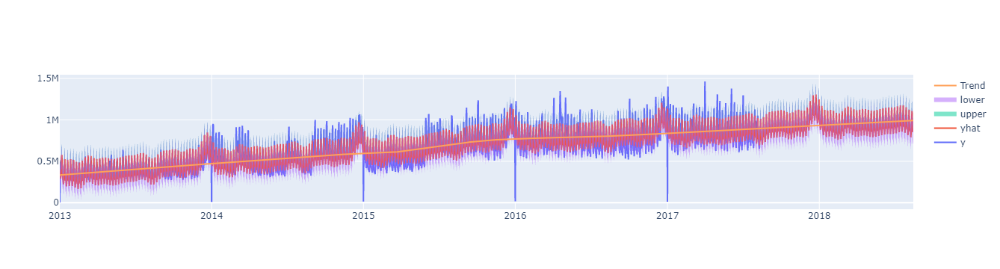

In [98]:
py.iplot([
    go.Scatter(x=df_timeseries['ds'], y=df_timeseries['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

In [99]:
def get_rsme(y_true, y_pred):
    """ RMSE """
    rmse = mean_squared_error(y_true, y_pred, squared=False)
    # print(f'rmse: {rmse}')
    return rmse

In [100]:
print(get_rsme(df_timeseries['y'], forecast.loc[:1683, 'yhat']))

108278.51063471948


In [101]:
# Попробуем подобрать коэффициент changepoint_prior_scale

In [102]:
for changepoint in np.arange(0.1, 3, 0.5):
    m = Prophet(changepoint_prior_scale=changepoint)
    m.fit(df_timeseries)
    future = m.make_future_dataframe(periods=365)
    forecast = m.predict(future)
    
    print(f"For changepoint_prior_scale: {changepoint}, RMSE: {get_rsme(df_timeseries['y'], forecast.loc[:1683, 'yhat'])}")

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


For changepoint_prior_scale: 0.1, RMSE: 103895.65505510569


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


For changepoint_prior_scale: 0.6, RMSE: 98290.3835153756


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


For changepoint_prior_scale: 1.1, RMSE: 97760.87640139124


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


For changepoint_prior_scale: 1.6, RMSE: 97588.51862690625


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


For changepoint_prior_scale: 2.1, RMSE: 97496.46959601363
For changepoint_prior_scale: 2.6, RMSE: 97438.0906345355


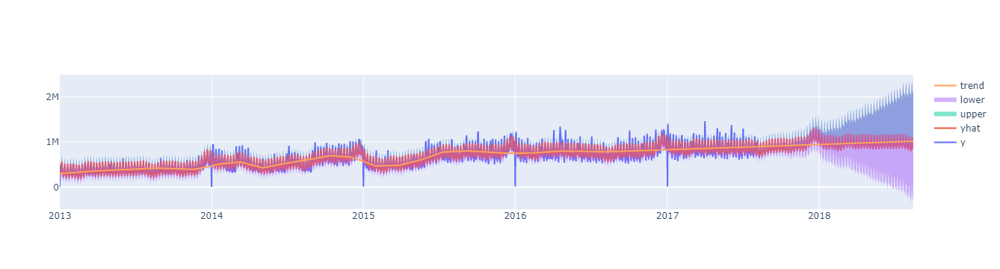

In [103]:
py.iplot([
    go.Scatter(x=df_timeseries['ds'], y=df_timeseries['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='trend')
])

При увеличении коэффициента размер ошибки сокращается. Но при этом, тренд становится более гибким, и увеличивается вероятность переобучения.

In [104]:
# Добавим в модель месячную сезонность (name='monthly', period=30.5, fourier_order=5). 

In [105]:
m = Prophet(changepoint_prior_scale=2.6)
m.add_seasonality(name='monthly', period=30.5, fourier_order=5)
m.fit(df_timeseries)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


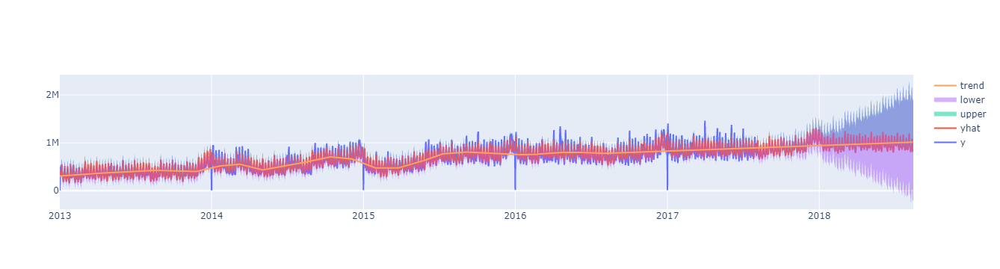

In [106]:
py.iplot([
    go.Scatter(x=df_timeseries['ds'], y=df_timeseries['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='trend')
])

In [107]:
print(get_rsme(df_timeseries['y'], forecast.loc[:1683, 'yhat']))

91017.40935134621


Путём добавления сезонности мы улучшили качество модели. Ошибка сократилась.

In [108]:
# Добавим данные о праздниках.

In [109]:
df_holidays_events = pd.read_csv('holidays_events.csv')

In [110]:
holidays = df_holidays_events[df_holidays_events['transferred'] == False][['description', 'date']]
holidays.columns = ['holiday', 'ds']
#holidays['lower_window'] = 0
#holidays['upper_window'] = 0
holidays

,holiday,ds
0,Fundacion de Manta,2012-03-02
1,Provincializacion de Cotopaxi,2012-04-01
2,Fundacion de Cuenca,2012-04-12
3,Cantonizacion de Libertad,2012-04-14
4,Cantonizacion de Riobamba,2012-04-21
...,...,...
345,Navidad-3,2017-12-22
346,Navidad-2,2017-12-23
347,Navidad-1,2017-12-24
348,Navidad,2017-12-25


In [111]:
m = Prophet(changepoint_prior_scale=3.5, holidays=holidays)
m.add_seasonality(name='monthly', period=30.5, fourier_order=5)
m.fit(df_timeseries)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [112]:
print(get_rsme(df_timeseries['y'], forecast.loc[:1683, 'yhat']))

74119.42669615449


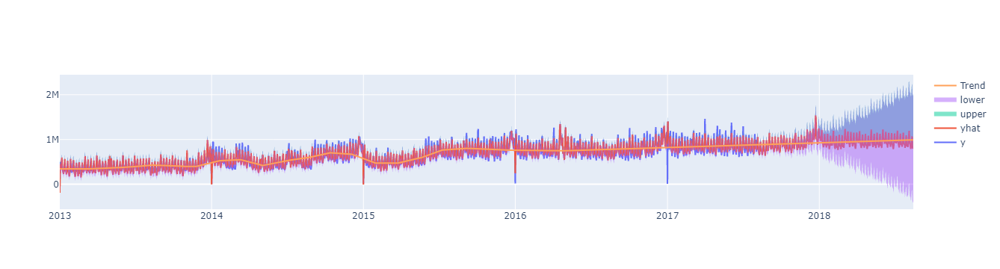

In [113]:
py.iplot([
    go.Scatter(x=df_timeseries['ds'], y=df_timeseries['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

Вывод: Библиотека Prophet заметно упрощает предсказание временных рядов и имеет рад гиперпараметров для донастройки модели. Используя changepoint_prior_scale, holidays и параметры сезонности, мы добились улучшения качества модели. Воможно, результат не идеальный, но простота использования позволяет сделать быстрый анализ за короткое время.

## 15.14. Бустинги/деревья

In [114]:
# Подготовим датасет для работы

In [115]:
df_sales = pd.DataFrame(df.groupby(df.date).sum()['unit_sales'])

In [116]:
df_sales

,unit_sales
date,
2013-01-01,2511.619
2013-01-02,496092.418
2013-01-03,361429.231
2013-01-04,354459.677
2013-01-05,477350.121
...,...
2017-08-11,826373.722
2017-08-12,792630.535
2017-08-13,865639.677


<AxesSubplot:xlabel='date'>

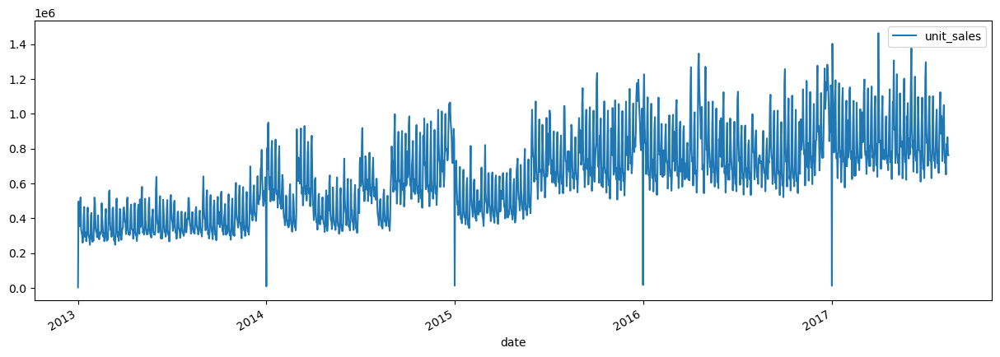

In [117]:
df_sales.plot(style='-', figsize=(15,5))

In [118]:
# Напишем функцию для добавления фич в датасет

In [119]:
def create_features(df_source):
    """ Функция создаёт признаки из индекса (datetime) """
    df = df_source.copy()
    df['hour'] = df.index.hour
    df['dayofweek'] = df.index.dayofweek
    df['quarter'] = df.index.quarter
    df['month'] = df.index.month
    df['year'] = df.index.year
    df['dayofyear'] = df.index.dayofyear
    df['dayofmonth'] = df.index.day
    df['weekofyear'] = df.index.isocalendar().week.astype('int64')
    return df

In [120]:
# Для разделения тестовых данных и валидационных используем переменную split_date
# Для валидации оставим пару лет.
split_date = '2016-01-01' 

In [121]:
# Так как нам придётся несколько раз гененировать датасеты из исходных данных, определим функцию

In [122]:
def prepare_train_test(df_source, split_date):
    """ Функция подготовки тренировочных и валидационных данных """
    
    # Добавляем фичи
    df_sales_features = create_features(df_source)
    
    # Разбиваем данные на тренировочные и валидационные
    sales_train = df_sales_features.loc[df_sales.index < split_date].copy()
    sales_test = df_sales_features.loc[df_sales.index >= split_date].copy()
    
    X_train, y_train = sales_train.drop(['unit_sales'], axis=1), sales_train['unit_sales']
    X_test, y_test = sales_test.drop(['unit_sales'], axis=1), sales_test['unit_sales']
    
    return sales_train, sales_test, X_train, y_train, X_test, y_test

In [123]:
sales_train, sales_test, X_train, y_train, X_test, y_test = prepare_train_test(df_sales, split_date)

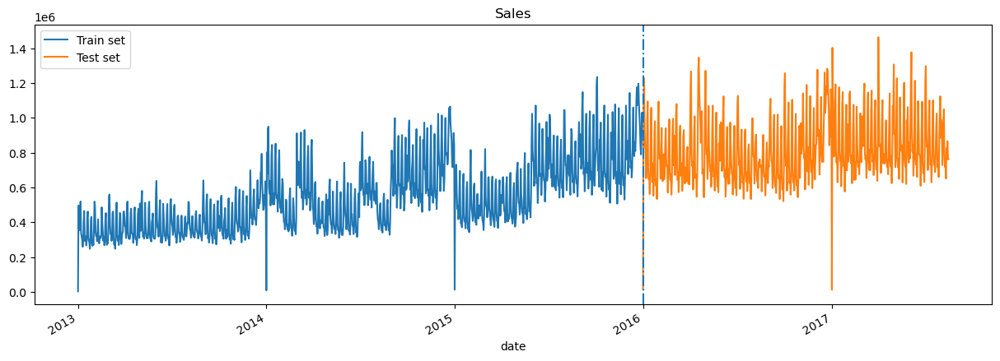

In [124]:
# Посмотрим, как выглядят датасеты на графике
pd.concat([sales_train.rename(columns={'unit_sales': 'Train set'}),
    sales_test.rename(columns={'unit_sales': 'Test set'})]) \
    [['Train set', 'Test set']] \
    .plot(figsize=(15,5), title='Sales', style='-')
plt.axvline(x=split_date, linestyle='-.')

In [125]:
# Проинициализируем и обучим модели XGBoost и, для сравнения, CatBoost.

In [126]:
import xgboost as xgb
from xgboost import plot_importance, plot_tree
from catboost import CatBoostRegressor

In [127]:
# Метрики
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

In [128]:
def errors(test, prediction):
    print(f'MSE: {mean_squared_error(test, prediction)}')
    print(f'RMSE: {mean_squared_error(test, prediction, squared=False)}')
    print(f'MAE: {mean_absolute_error(test, prediction)}')
    print(f'MAPE: {mean_absolute_percentage_error(test, prediction)}')

In [129]:
# Обучим модель XGBoost
reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
        verbose=50)

[0]	validation_0-rmse:411381.72317	validation_1-rmse:655130.53629
[50]	validation_0-rmse:12600.18698	validation_1-rmse:249886.55871
[100]	validation_0-rmse:7464.37737	validation_1-rmse:249646.61030
[150]	validation_0-rmse:4085.93185	validation_1-rmse:249385.81478


C:\Users\Lyo\Anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



[200]	validation_0-rmse:2646.38545	validation_1-rmse:249340.53628
[223]	validation_0-rmse:2191.56107	validation_1-rmse:249352.13667


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=1000,
             n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
             reg_alpha=0, reg_lambda=1, ...)

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

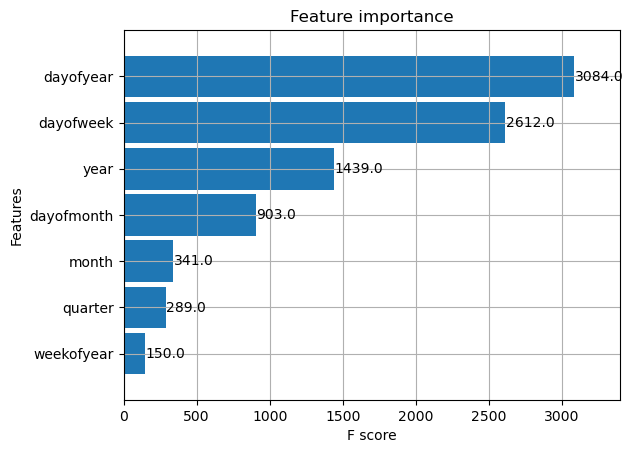

In [130]:
# Проанализируем важность признаков
plot_importance(reg, height=0.9)

Согласно графику, наиболее важный параметр dayofyear и dayofweek. В то время, как weekofyear имеет наименьшую важность

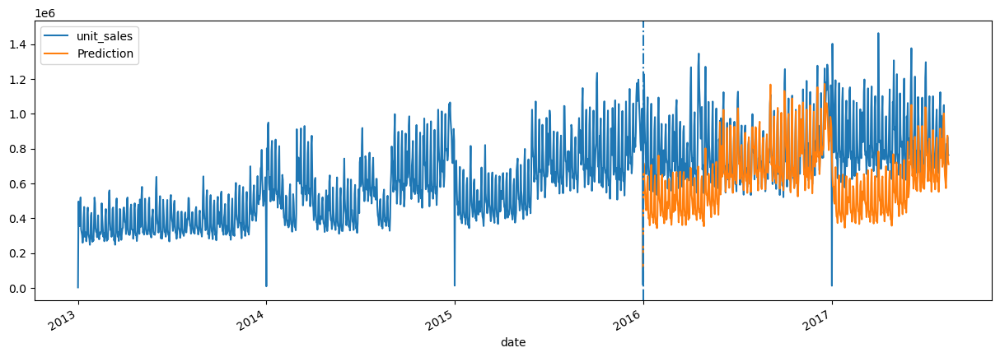

In [131]:
# Делаем прогноз
sales_test['Prediction'] = reg.predict(X_test)

# Посмотрим на графике
sales = pd.concat([sales_test, sales_train], sort=False)
sales[['unit_sales', 'Prediction']].plot(figsize=(15,5), style='-')
plt.axvline(x=split_date, linestyle='-.')

In [132]:
# Ошибки
errors(sales_test['unit_sales'], sales_test['Prediction'])

MSE: 62159125569.53939
RMSE: 249317.31903247192
MAE: 196113.37291078953
MAPE: 0.3450629782982966


In [133]:
# Обучим модель CatBoost
cbr = CatBoostRegressor(n_estimators=1000)
cbr.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
        verbose=50)

Learning rate set to 0.04685
0:	learn: 193338.6109077	test: 193338.6109077	test1: 325363.1528755	best: 325363.1528755 (0)	total: 160ms	remaining: 2m 40s
50:	learn: 79501.1473241	test: 79501.1473241	test1: 259851.6436696	best: 259851.6436696 (50)	total: 431ms	remaining: 8.02s
100:	learn: 61031.2285669	test: 61031.2285669	test1: 253201.3687189	best: 253201.3687189 (100)	total: 635ms	remaining: 5.65s
150:	learn: 51289.8282995	test: 51289.8282995	test1: 251227.8329508	best: 251119.8672659 (147)	total: 1.1s	remaining: 6.18s
200:	learn: 44521.5665542	test: 44521.5665542	test1: 250189.8812871	best: 249822.7193492 (186)	total: 1.55s	remaining: 6.15s
250:	learn: 39987.7906022	test: 39987.7906022	test1: 249728.7219594	best: 249692.4523437 (248)	total: 1.98s	remaining: 5.91s
300:	learn: 36266.3128449	test: 36266.3128449	test1: 249498.3050400	best: 249445.0986814 (299)	total: 2.42s	remaining: 5.61s
350:	learn: 33792.9216506	test: 33792.9216506	test1: 249232.2422657	best: 249198.0344802 (345)	total

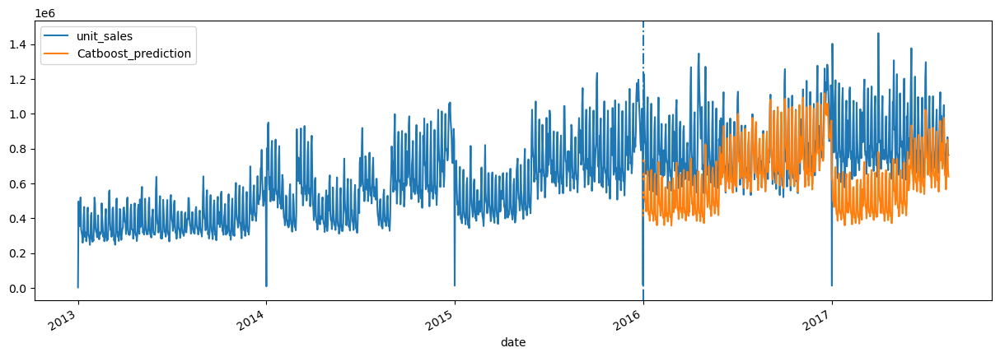

In [134]:
# Делаем прогноз
sales_test['Catboost_prediction'] = cbr.predict(X_test)

sales = pd.concat([sales_test, sales_train], sort=False)
sales[['unit_sales', 'Catboost_prediction']].plot(figsize=(15,5), style='-')
plt.axvline(x=split_date, linestyle='-.')

In [135]:
# Ошибки
errors(sales_test['unit_sales'], sales_test['Catboost_prediction'])

MSE: 62039854110.830734
RMSE: 249078.0080834732
MAE: 197432.66709220523
MAPE: 0.3561452376906553


#### Вывод
На тренировочных данных первые полугодия выглядит примерно одинаковым, что заметно отразилось и на спрогнозированном результате, где по факту продажи выросли.
При этом, второе полугодие выглядит более точным.

XGBoost и Catboost, без дополнительного тюнинга показали примерно одинаковый результат.

Попробуем улучшить результат

In [136]:
# Выбросы

array([[<AxesSubplot:title={'center':'unit_sales'}>]], dtype=object)

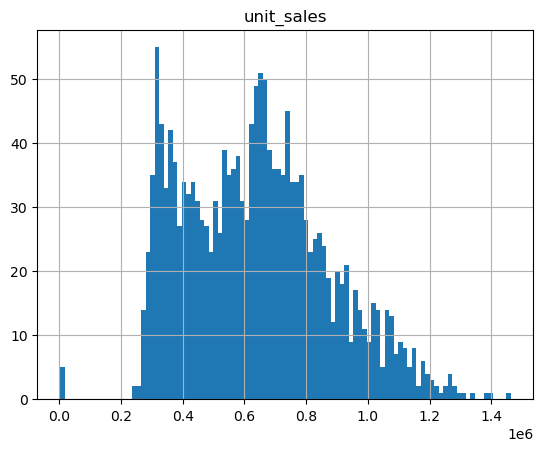

In [137]:
df_sales.hist(bins=100)

In [138]:
df_sales.unit_sales.sort_values().head(10)

date
2013-01-01      2511.6190
2014-01-01      8602.0654
2017-01-01     12082.5010
2015-01-01     12773.6170
2016-01-01     16433.3940
2013-01-24    247245.6910
2013-03-14    247541.4200
2013-01-10    258982.0030
2013-01-29    264488.8180
2013-06-27    266525.4590
Name: unit_sales, dtype: float64

In [139]:
# Самые низкие показатели, ожидаемо - 1 января
# Оставим продажи свыше 200000
df_sales = df_sales[df_sales.unit_sales > 200000]

При анализе полученного прогноза, мы обратили внимание на занижение продаж в первом полугодии. Попробуем подтянуть, добавив усредненное значение за неделю. Для этого переопределиим функцию create_features и сгенерируем новые датасеты. Также, добавим lag (> X_test.shape).

In [140]:
def create_features(df_source):
    """ Функция создаёт дополнительные признаки """
    N = 7 # количество дней для усреднения
    LN = 600 # лаг в днях
    
    df = df_source.copy()
    df['hour'] = df.index.hour
    df['dayofweek'] = df.index.dayofweek
    df['quarter'] = df.index.quarter
    df['month'] = df.index.month
    df['year'] = df.index.year
    df['dayofyear'] = df.index.dayofyear
    df['dayofmonth'] = df.index.day
    df['weekofyear'] = df.index.isocalendar().week.astype('int64')
    # Усреднение
    df[f'mean_{N}'] = df.unit_sales.rolling(window=N).mean()
    # Лаг
    df[f'lag_{LN}'] = df.unit_sales.shift(LN)
    
    return df

In [141]:
sales_train, sales_test, X_train, y_train, X_test, y_test = prepare_train_test(df_sales, split_date)

In [142]:
# Добавим праздничные дни

In [143]:
import holidays

In [144]:
us_holidays = holidays.US()  # Исходный датасет, вероятнее всего, оттуда )

In [145]:
X_train['date'] = X_train.index
X_test['date'] = X_test.index

X_train['holidays'] = X_train.date.apply(lambda x: 1 if us_holidays.get(x) else 0)
X_test['holidays'] = X_test.date.apply(lambda x: 1 if us_holidays.get(x) else 0)

X_train.drop(['date'], axis=1, inplace=True)
X_test.drop(['date'], axis=1, inplace=True)

In [146]:
# Обучим модель на обновлённых данных (подтюнингуем learning_rate)
reg = xgb.XGBRegressor(n_estimators=1000, learning_rate=0.2)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
        verbose=50)

[0]	validation_0-rmse:465536.76889	validation_1-rmse:683877.58805
[50]	validation_0-rmse:14159.44317	validation_1-rmse:91029.00473
[100]	validation_0-rmse:7809.88014	validation_1-rmse:90714.22434


C:\Users\Lyo\Anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



[137]	validation_0-rmse:5377.12582	validation_1-rmse:91185.91610


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.2, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=1000,
             n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
             reg_alpha=0, reg_lambda=1, ...)

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

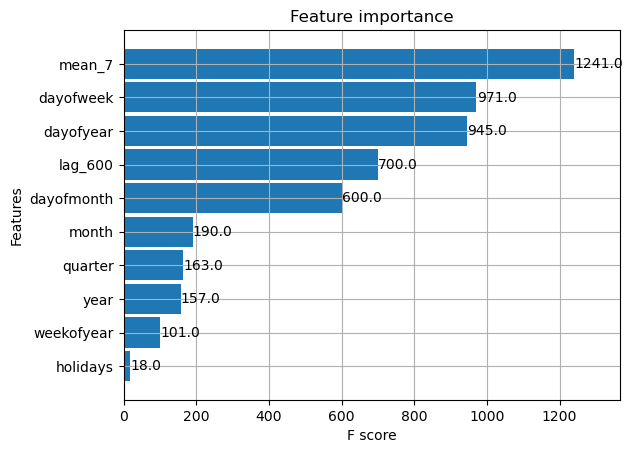

In [147]:
# Посмотрим, что изменилось
plot_importance(reg, height=0.9)

In [148]:
# В Лидеры вырвался показатель средней за 7 дней

<AxesSubplot:xlabel='date'>

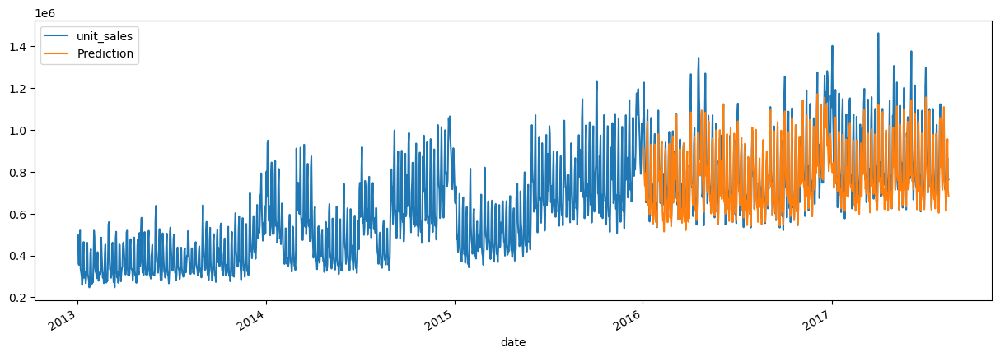

In [149]:
# Делаем предсказание
sales_test['Prediction'] = reg.predict(X_test)

sales = pd.concat([sales_test, sales_train], sort=False)
sales[['unit_sales', 'Prediction']].plot(figsize=(15,5), style='-')

<AxesSubplot:xlabel='date'>

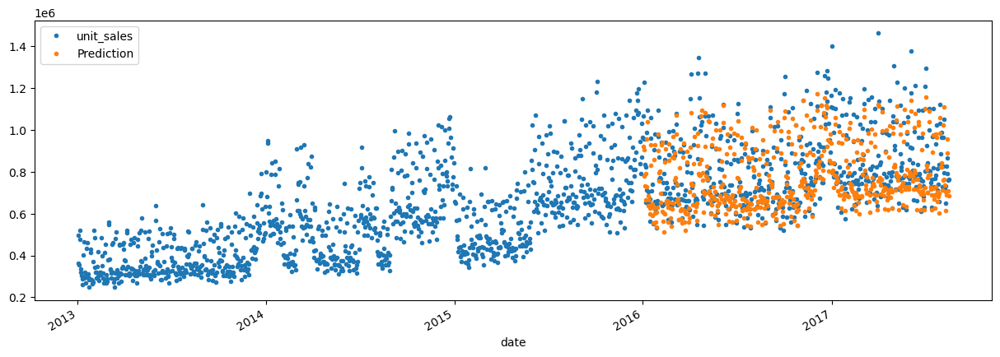

In [150]:
sales[['unit_sales', 'Prediction']].plot(figsize=(15,5), style='.')

In [151]:
errors(sales_test['unit_sales'], sales_test['Prediction'])

MSE: 8190519264.271538
RMSE: 90501.48763568219
MAE: 61123.95479491508
MAPE: 0.06959295245880989


In [152]:
# Самые грубые ошибки
abs(sales_test['unit_sales'] - sales_test['Prediction']).sort_values(ascending=False).head(5)

date
2017-01-02    605124.1835
2016-04-18    553355.3550
2017-05-01    484029.3045
2016-04-19    368528.4580
2016-12-23    359226.6420
dtype: float64

In [153]:
# Сохраняем модель
reg.save_model('xgb_regressor.json')

Learning rate set to 0.046826
0:	learn: 191118.6831708	test: 191118.6831708	test1: 320081.2865479	best: 320081.2865479 (0)	total: 10.7ms	remaining: 10.7s
50:	learn: 61842.9986224	test: 61842.9986224	test1: 165586.8304588	best: 165586.8304588 (50)	total: 303ms	remaining: 5.63s
100:	learn: 45701.9249631	test: 45701.9249631	test1: 142877.8197538	best: 142877.8197538 (100)	total: 514ms	remaining: 4.58s
150:	learn: 39571.0937315	test: 39571.0937315	test1: 136115.4033614	best: 135952.0700341 (148)	total: 707ms	remaining: 3.98s
200:	learn: 34824.2414587	test: 34824.2414587	test1: 132383.9992444	best: 132383.9992444 (200)	total: 1.07s	remaining: 4.25s
250:	learn: 31690.2811190	test: 31690.2811190	test1: 130433.6746872	best: 130433.6746872 (250)	total: 1.51s	remaining: 4.5s
300:	learn: 29217.4961285	test: 29217.4961285	test1: 129399.9659845	best: 129332.4737428 (290)	total: 1.7s	remaining: 3.95s
350:	learn: 27030.5354757	test: 27030.5354757	test1: 128575.5429877	best: 128394.5155088 (345)	total

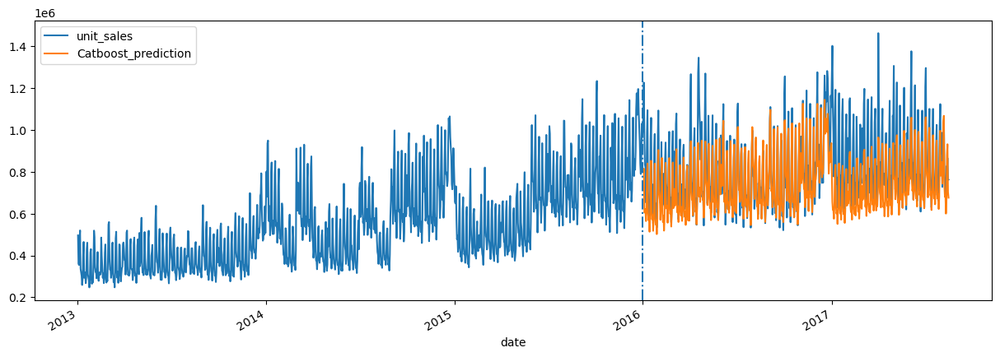

In [154]:
# Обучим модель CatBoost
cbr = CatBoostRegressor(n_estimators=1000)
cbr.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
        verbose=50)

# Делаем прогноз
sales_test['Catboost_prediction'] = cbr.predict(X_test)

sales = pd.concat([sales_test, sales_train], sort=False)
sales[['unit_sales', 'Catboost_prediction']].plot(figsize=(15,5), style='-')
plt.axvline(x=split_date, linestyle='-.')


In [155]:
# Ошибки
errors(sales_test['unit_sales'], sales_test['Catboost_prediction'])

MSE: 16382167440.760656
RMSE: 127992.84136529143
MAE: 90867.70371044498
MAPE: 0.10211372288773927


### Вывод
Мы значительно улучшили результат путём отсечения выбросов и добавления новых фич, таких как усреднённое зачение и лаг(600). В данном случае, XGBoost показывает результат более качественный, чем Catboost.